# <span style="font-family:Roboto"> Bias in EuroSAT </span>

<span style="font-family:Roboto"> **Author** - [Vuong NGUYEN](https://github.com/XuanMinhVuongNGUYEN) </span>

- <span style="font-family:Roboto"> [**The EuroSAT dataset**](https://github.com/phelber/eurosat) is a land-cover satellite image classification use-case on 13 spectral bands consisting on 10 classes and containing 27000 labeled and geo-referenced examples. As we will be placing ourselves in the **fairness** framework, we will be simplyfying our problem to a Highway/River binary classification problem, where we also know that a small percentage of images (~3\% of the whole dataset) has a certain blue-veiled property. As we will prove later, this group of images constitutes a discriminated group in the sense of the equality of odds/errors. </span>

- <span style="font-family:Roboto"> To identify these images, we will transform the images to the HSV color-space, and use custom thresholds in the mean of each channel to flag each image as either discriminated (blue-veiled, S=0) or not (S=1). In particular, we fix this threshold at 0.35 for the saturation channel, 0.4 for the value, and verify that the hue's value is between 210 and 270. With this information, we can calculate some statistics about the dataset. </span>

# <span style="font-family:Roboto; color:#002E63"> Imports </span>

<span style="font-family:Roboto"> We import the necessary libraries and tools. </span>

In [4]:
import os
import random
import torch
import numpy as np
import pandas as pd
from PIL import Image as PilImage
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from matplotlib import pyplot as plt

from dataset import load_dataset_filtered_eurosat

from utils import plot_wrong_pred, plot_bar_err_rate, plot_loss_acc_train,\
                plot_bar_acc_simu_simple, plot_err_rate_simu_simple,\
                plot_bar_acc_simu_double, plot_err_rate_simu_double,\
                plot_err_rate_test, plot_acc_test, plot_err_rate_test_double,\
                plot_heatmap_accuracy, plot_heatmap_err_rate, average_seeds

# <span style="font-family:Roboto; color:#002E63"> Exploring EuroSAT </span>

<span style="font-family:Roboto"> Let's take a look at the distribution of the number of highway and river images on blue-veiled and normal properties in this dataset. </span>

In [3]:
ds_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/data/EuroSAT"

In [4]:
# (Re)set the seeds
seed = 42
os.environ['PYTHONHASHSEED'] = str(seed)
# Torch RNG
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
# Python RNG
np.random.seed(seed)
random.seed(seed)

# Load the dataset
X_train, S_train, y_train, X_test, S_test, y_test = load_dataset_filtered_eurosat(path=ds_path)
print('EuroSAT dataset loaded !')
print('Training dataset (X,S,Y) : {} {} {}'.format(X_train.shape, S_train.shape, y_train.shape))
print('Testing dataset  (X,S,Y) : {} {} {}'.format(X_test.shape, S_test.shape, y_test.shape))

EuroSAT dataset loaded !
Training dataset (X,S,Y) : (3750, 3, 64, 64) (3750,) (3750,)
Testing dataset  (X,S,Y) : (1250, 3, 64, 64) (1250,) (1250,)


In [5]:
highway_images = X_train[np.where(y_train==0)]
highway_labels = y_train[np.where(y_train==0)]

blue_highway_images = X_train[np.where((S_train==0) & (y_train==0))]
blue_highway_labels = y_train[np.where((S_train==0) & (y_train==0))]

river_images = X_train[np.where(y_train==1)]
river_labels = y_train[np.where(y_train==1)]

blue_river_images = X_train[np.where((S_train==0) & (y_train==1))]
blue_river_labels = y_train[np.where((S_train==0) & (y_train==1))]

In [6]:
fig = go.Figure()
x = ['Highway', 'River']

fig.add_trace(go.Bar(
    name='Blue',
    x=x, y=[len(blue_highway_images) , len(blue_river_images)]))

fig.add_trace(go.Bar(
    name='Normal',
    x=x, y=[len(highway_images) , len(river_images)]))

fig.update_layout(title="Number of highway and river images on blue-veiled and normal property in train dataset", yaxis_title="Number", barmode="group")
fig.show()

<span style="font-family:Roboto"> We can see a big difference in the number of blue-veiled and normal properties in both highway and river images in the dataset. For example, the normal highway has 1875 images which is very large compared to the blue-veiled highway with 30 images, which is 98.4% less. The normal river with 1875 images is quite large compared to the blue-veiled river with 80 images, which is 95.74% less. This shows that the images with blue-veiled property account for a very small percentage of the EuroSAT dataset. </span>

# <span style="font-family:Roboto; color:#002E63"> Baseline (ResNet18 + Vgg16) </span>

<span style="font-family:Roboto"> To evaluate if the minority groups highlighted previously creates a bias in the learning an AI model, we take a `ResNet18` and a `Vgg16` model as a baseline model for comparison of error rates between groups. </span>

<span style="font-family:Roboto"> One caveat here is that we trained all the classification models 10 times corresponding to different seed values. The purpose here is to see if, with different seed values, the error rate of the classification models changes much. </span>

## <span style="font-family:Roboto; color:#FF3800"> ResNet18 </span>

- <span style="font-family:Roboto"> For specific steps to make this work with `ResNet18` model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> </span>

In [7]:
save_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/Exp/Output_ResNet18"

In [8]:
acc, err_rate = average_seeds(path=f"{save_path}/Baseline", nb_seeds=10)

In [19]:
fig = make_subplots(rows=1, cols=3, subplot_titles=("Combination", "Property", "Images"))
x_img = ['Highway', 'River']

fig.add_trace(go.Bar(
    name='Blue-veiled',
    x=x_img, y=[err_rate[0][0] , err_rate[0][1]]), row=1, col=1)

fig.add_trace(go.Bar(
    name='Normal',
    x=x_img, y=[err_rate[0][4] , err_rate[0][5]]), row=1, col=1)

fig.add_trace(go.Bar(
    name="Property",
    x=x, y=err_rate[0][2:4]), row=1, col=2)

fig.add_trace(go.Bar(
    name="Images",
    x=x_img, y=err_rate[0][6:]), row=1, col=3)

fig.update_layout(title="Error rate of image groups of Baseline (ResNet18)", yaxis_title="Error rate", barmode="group")
fig.show()

<span style="font-family:Roboto"> We find that minority image groups such as blue-veiled property have a significantly higher error rate than their normal property counterparts. This is exactly as we would expect, minority groups suffer from a significant error rate bias. </span>

## <span style="font-family:Roboto; color:#FF3800"> Vgg16 </span>

- <span style="font-family:Roboto"> For specific steps to make this work with `Vgg16` model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> </span>

In [20]:
save_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/Exp/Output_Vgg16"

In [21]:
acc, err_rate = average_seeds(path=f"{save_path}/Baseline", nb_seeds=10)

In [22]:
fig = make_subplots(rows=1, cols=3, subplot_titles=("Combination", "Property", "Images"))
x_img = ['Highway', 'River']

fig.add_trace(go.Bar(
    name='Blue-veiled',
    x=x_img, y=[err_rate[0][0] , err_rate[0][1]]), row=1, col=1)

fig.add_trace(go.Bar(
    name='Normal',
    x=x_img, y=[err_rate[0][4] , err_rate[0][5]]), row=1, col=1)

fig.add_trace(go.Bar(
    name="Property",
    x=x, y=err_rate[0][2:4]), row=1, col=2)

fig.add_trace(go.Bar(
    name="Images",
    x=x_img, y=err_rate[0][6:]), row=1, col=3)

fig.update_layout(title="Error rate of image groups of Baseline (ResNet18)", yaxis_title="Error rate", barmode="group")
fig.show()

<span style="font-family:Roboto"> In this case, the error rate of minority groups is smaller than that of the normal groups. Therefore, the bias of minority groups did not occur, this is because the Vgg16 model works too hard for the EuroSAT dataset, resulting in a low error rate. However we still Vgg16 for our experiments to see if the Data Augmentation methods improve the model's performance. </span>

# <span style="font-family:Roboto; color:#002E63"> Data Augmentation </span>

<span style="font-family:Roboto"> So the question is how to handle this bias. One way to solve this problem is to implement Data Augmentation methods by creating new images of the minority groups here is blue-veiled images, then adding the augmented images to the original dataset and retraining the model. In this work, we investigated several Data Augmentation methods to evaluate their ability to mitigate the bias. Next subsections introduce the different methods we used on the EuroSAT dataset.</span>

## <span style="font-family:Roboto; color:#FF3800"> Oversampling </span>
- <span style="font-family:Roboto"> Oversampling is a technique in machine learning used to address class imbalance. It involves increasing the number of instances in the minority groups by generating synthetic samples or replicating existing ones. This aims to balance the distribution of classes in the training dataset, which can improve the performance of machine learning models, particularly in binary classification tasks. </span>

- <span style="font-family:Roboto"> In this case, we use the Oversampling method to replicate the images of minorities `(blue-veiled highway and blue-veiled river)` into the original dataset. We will replicate the images of the minority group into the original dataset until this minority group reaches the percentage of 5%, 10%,... compared to the total number of images of the class to be predicted `(highway and river)` in the dataset for our task. In summary, Oversampling increases the representativeness of the minority group like `blue-veiled highway and blue-veiled river`. </span>

## <span style="font-family:Roboto; color:#FF3800"> Undersampling </span>
- <span style="font-family:Roboto"> Undersampling is another technique used to mitigate class imbalance in machine learning datasets. It focuses on reducing the number of instances in the majority group to balance it with the minority group. This is typically done by randomly removing examples from the majority group. Undersampling can help prevent models from being biased toward the majority group and can improve their ability to recognize the minority group. </span>

- <span style="font-family:Roboto"> In this case, we use the Undersampling method to randomly removing the images of the majority group `(normal highway and normal river)` from the original dataset until the minority group `(blue-veiled highway and blue-veiled river)` reach the ratio 5%, 10%,... compared to the total number of images of the class to be predicted `(highway and river)` in the dataset for our task. In summary, Oversampling reduces the representativeness of the majority group like `normal highway and normal river`. </span>

## <span style="font-family:Roboto; color:#FF3800"> Neural Style Transfer </span>

<span style="font-family:Roboto"> The approach we immediately think of is to change the image style of the normal images to get the new blue-veiled images. An interesting method is Neural Style Transfer (NST), we will test methods including `FDA, StyleFlow, and CCPL` to change the style of normal images. </span>

<span style="font-family:Roboto"> To make it easier to understand, we will actually take 2 images, one with the content we want to style, and another with the style we are aiming for. Then use the methods we introduced above to extract the style from the second image then combine it with the content of the first image to create a new image with the content and style we desire. To better visualize the `NST` methods, please see the image below. On the left is the image with the content we want to change the style, the small image in the bottom corner is the styled image we are aiming for (the image is blue-veiled), and the image on the right is the image that has been created after combining content and style. </span>

<img src="/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/nst.png" alt="Picture" style="display: block; margin: 0 auto" />

### <span style="font-family:Roboto; color:#0BDA51"> Fourrier Domain Adaptation (FDA) </span>

<span style="font-family:Roboto"> Simplified domain adaptation via style transfer thanks to the Fourier transformation. The FDA does not need deep networks for style transfer and adversarial training. </span>

<img src="/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/Exp/imgs/fda.png" alt="Picture" style="display: block; margin: 0 auto" />

<span style="font-family:Roboto"> The scheme of the proposed Fourier domain adaptation method: </span>
    <ul> <li> <span style="font-family:Roboto; color:gold"> Step 1: </span> <span style="font-family:Roboto"> Apply FFT to source and target images. </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> Step 2: </span> <span style="font-family:Roboto"> Replace the low frequency part of the source amplitude with that of the target. </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> Step 3: </span> <span style="font-family:Roboto"> Apply the inverse FFT to the modified source spectrum. </span> </li> </ul>

- <span style="font-family:Roboto"> For specific steps to make this work with the FDA, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>   

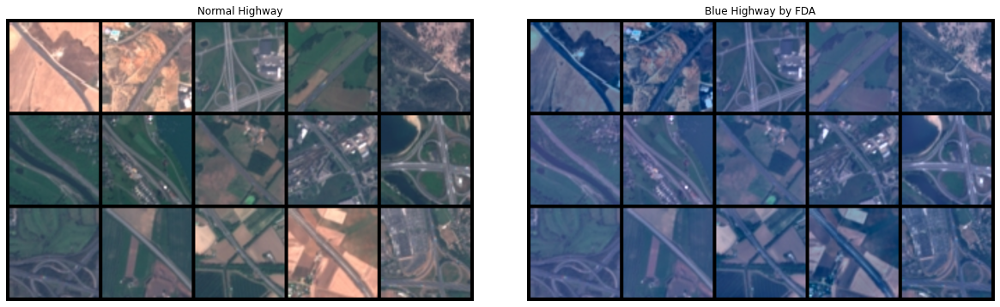

In [7]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/hw_normal.png")
ax1.imshow(img)
ax1.set_title("Normal Highway")
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/FDA/hw_fda.png")
ax2.imshow(img)
ax2.set_title("Blue Highway by FDA")
ax2.axis("off")

fig.tight_layout()
fig.show()

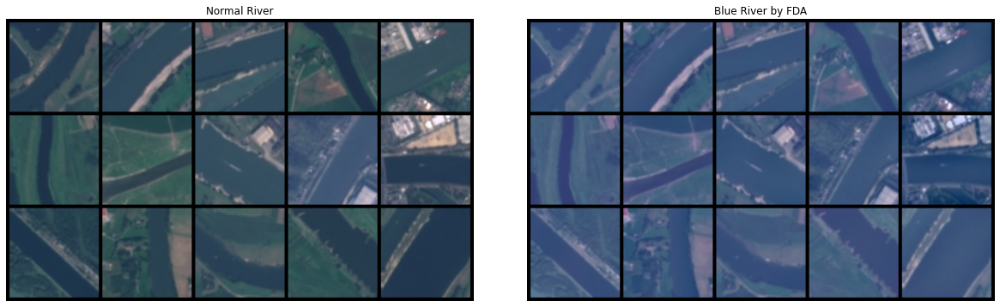

In [8]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/rv_normal.png")
ax1.imshow(img)
ax1.set_title("Normal River")
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/FDA/rv_fda.png")
ax2.imshow(img)
ax2.set_title("Blue River by FDA")
ax2.axis("off")

fig.tight_layout()
fig.show()

### <span style="font-family:Roboto; color:#0BDA51"> StyleFlow For Content-Fixed Image to Image Translation (StyleFlow) </span>

<span style="font-family:Roboto"> With the invertible network structure, StyleFlow first projects the input images into the feature space in the forward, while the backward uses the SAN module to perform the fixed feature transformation of the content, and then projects them into image space. </span>

<img src="/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/Exp/imgs/flow.png" width=800 alt="Picture" style="display: block; margin: 0 auto" />


<span style="font-family:Roboto"> The blue arrows indicate the forward pass to extract the features, while the red arrows represent the backward pass to reconstruct the images. StyleFlow consists of a series of reversible blocks, where each block has three components: the `Squeeze module`, the `Flow module`, and the `SAN module`. A pre-trained VGG encoder is used for domain feature extraction. </span>
    <ul> <li> <span style="font-family:Roboto; color:gold"> Squeeze module: </span> <span style="font-family:Roboto"> The Squeeze operation serves as an interconnection between blocks for reordering features. It reduces the spatial size of the feature map by first dividing the input feature into small patches along the spatial dimension and then concatenating the patches along the channel dimension. </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> Flow module: </span> <span style="font-family:Roboto"> The Flow module consists of three reversible transformations: Actnorm Layer, 1x1 Convolution Layer, and Coupling Layer. </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> SAN module: </span> <span style="font-family:Roboto"> SAN module to perform fixed content feature transformation. Fixed content transfer means that content information before and after transformation should be retained. </span> </li> </ul>

- <span style="font-family:Roboto"> For specific steps to make this work with the StyleFlow model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>   

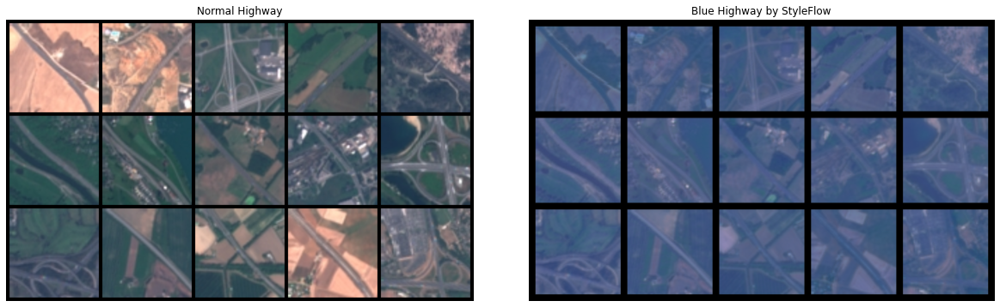

In [9]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/hw_normal.png")
ax1.imshow(img)
ax1.set_title("Normal Highway")
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/Flow/hw_flow.png")
ax2.imshow(img)
ax2.set_title("Blue Highway by StyleFlow")
ax2.axis("off")

fig.tight_layout()
fig.show()

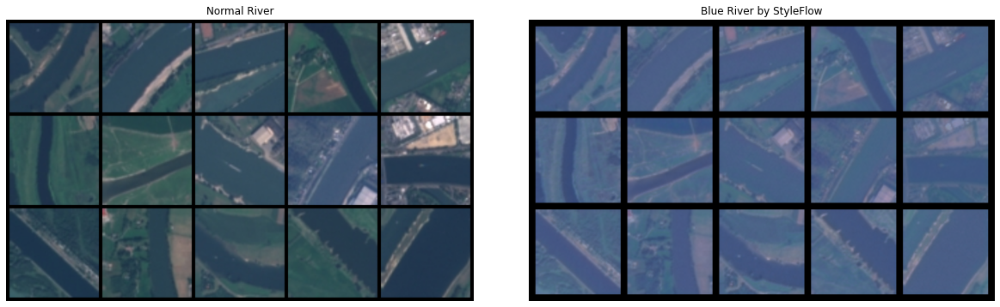

In [10]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/rv_normal.png")
ax1.imshow(img)
ax1.set_title("Normal River")
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/Flow/rv_flow.png")
ax2.imshow(img)
ax2.set_title("Blue River by StyleFlow")
ax2.axis("off")

fig.tight_layout()
fig.show()

### <span style="font-family:Roboto; color:#0BDA51"> Contrastive Coherence Preserving Loss for Versatile Style Transfer (CCPL) </span>

<span style="font-family:Roboto"> Another method to do style change is to use CCPL model. </span>

<img src="/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/Exp/imgs/ccpl1.png" alt="Picture" style="display: block; margin: 0 auto" />

<span style="font-family:Roboto; color:gold"> Inspirations for CCPL: </span> <span style="font-family:Roboto"> Regions denoted by red boxes from the first frame `(RA or R'A)` have the same location with corresponding patches in the second frame wrapped in a yellow box `(RB or R'B)`. `RC and R'C` (in the blue boxes) are cropped from the first frame but their style aligns with `RB and R'B`. The difference between two patches is denoted by `D` (for example, D(RA, RB)). Mutual information between `D(RA, RC)` and `D(R'A, R'C)`, `(D(RA, RB) and D(R'A, R'B))` is encouraged to be maximized to preserve consistency from the content source. </span> </li>

<img src="/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/Exp/imgs/ccpl2.png" alt="Picture" style="display: block; margin: 0 auto" />

<span style="font-family:Roboto; color:gold"> Details of CCPL: </span> <span style="font-family:Roboto"> `Cf` and `Gf` represent the encoded features of a specific layer of encoder `E`. `⊖` denotes vector subtraction, and `SCE` stands for softmax cross-entropy. The yellow dotted lines illustrate how the positive pair is produced. </span>

- <span style="font-family:Roboto"> For specific steps to make this work with the CCPL model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>   

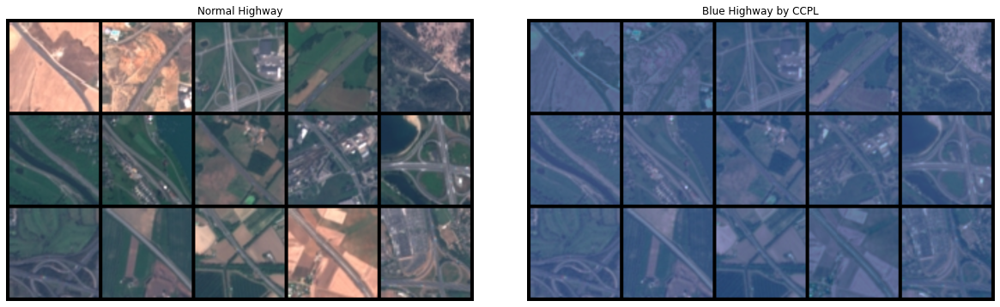

In [11]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/hw_normal.png")
ax1.imshow(img)
ax1.set_title("Normal Highway")
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/CCPL/hw_ccpl.png")
ax2.imshow(img)
ax2.set_title("Blue Highway by CCPL")
ax2.axis("off")

fig.tight_layout()
fig.show()

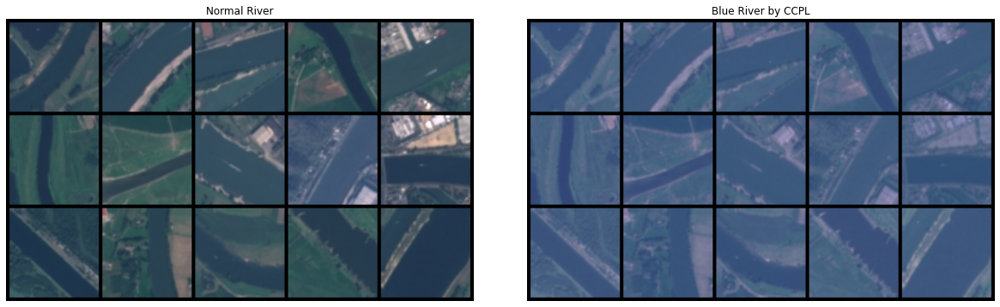

In [12]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/rv_normal.png")
ax1.imshow(img)
ax1.set_title("Normal River")
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/CCPL/rv_ccpl.png")
ax2.imshow(img)
ax2.set_title("Blue River by CCPL")
ax2.axis("off")

fig.tight_layout()
fig.show()

## <span style="font-family:Roboto; color:#FF3800"> GAN </span>

<span style="font-family:Roboto"> Another approach that should be tested is GAN models. Here we take back the DCGAN model available in Augmentare for testing. </span>

### <span style="font-family:Roboto; color:#0BDA51"> Deep Convolutional GAN (DCGAN) </span>

<span style="font-family:Roboto"> To generate new images by DCGAN model, we first trained this model on normal highway image set and then generated new normal highway images. Since the number of blue-veiled highway images in the dataset is too small (30 images) and to save time, we reused the model after training on the normal highway image set and continued to train it on the blue highway image set and then generate new blue highway images. We did the same for the task of generating river images. </span>

- <span style="font-family:Roboto"> For specific steps to make this work with the CCPL model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>

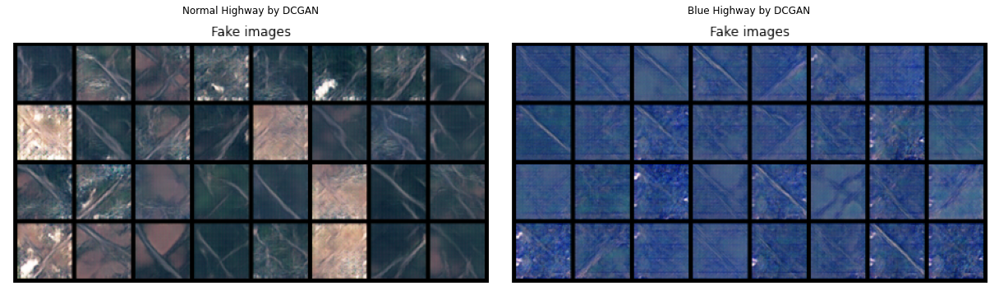

In [13]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/GAN_output/hw_normal.png")
ax1.imshow(img)
ax1.set_title("Normal Highway by DCGAN")
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/GAN_output/hw_blue.png")
ax2.imshow(img)
ax2.set_title("Blue Highway by DCGAN")
ax2.axis("off")

fig.tight_layout()
fig.show()

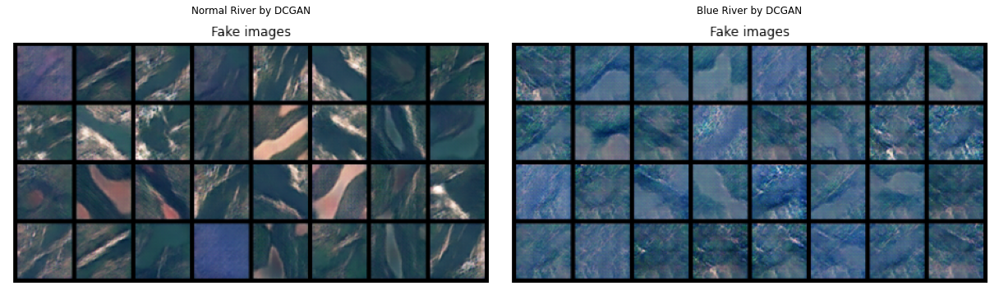

In [14]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/GAN_output/rv_normal.png")
ax1.imshow(img)
ax1.set_title("Normal River by DCGAN")
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/GAN_output/rv_blue.png")
ax2.imshow(img)
ax2.set_title("Blue River by DCGAN")
ax2.axis("off")

fig.tight_layout()
fig.show()

<span style="font-family:Roboto"> We can see that the DCGAN model works well and produces not-bad normal and blue images. However, the generated blue images are relatively different from the minority blue-veiled images, especially the poorly generated river blue images. Compared with the AutoEncoder model, DCGAN gives better quality results, but the generated samples are quite similar with no diversity, namely normal highway images. </span>

## <span style="font-family:Roboto; color:#FF3800"> GAN + NST </span>

<span style="font-family:Roboto"> To obtain better blue images, we combined the DCGAN model and NST models `(FDA and Flow)`. We basically took the normal images generated by DCGAN and then used NST methods to style these normal images into blue images. Let's see the results below. </span>

### <span style="font-family:Roboto; color:#0BDA51"> DCGAN + FDA </span>

- <span style="font-family:Roboto"> For specific steps to make this work with the CCPL model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>

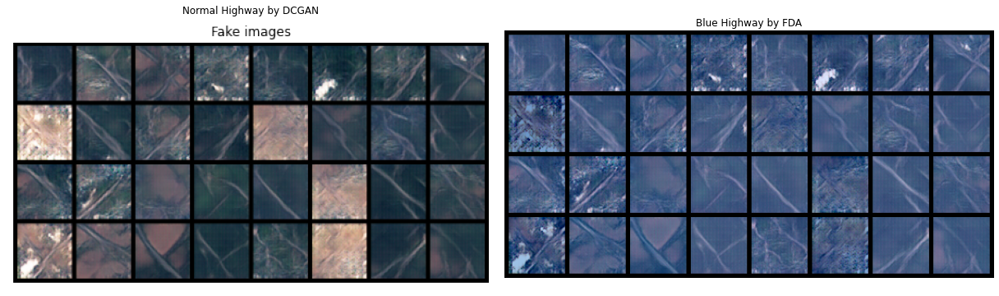

In [16]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/GAN_output/hw_normal.png")
ax1.imshow(img)
ax1.set_title("Normal Highway by DCGAN")
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/DCGAN_FDA/hw_dcgan_fda.png")
ax2.imshow(img)
ax2.set_title("Blue Highway by FDA")
ax2.axis("off")

fig.tight_layout()
fig.show()

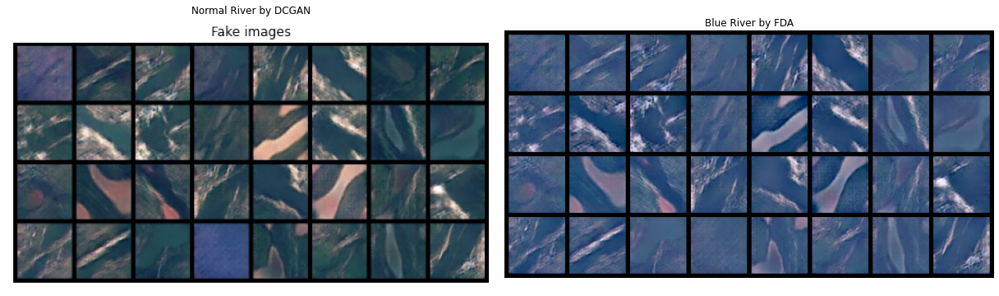

In [17]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/GAN_output/rv_normal.png")
ax1.imshow(img)
ax1.set_title("Normal River by DCGAN")
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/DCGAN_FDA/rv_dcgan_fda.png")
ax2.imshow(img)
ax2.set_title("Blue River by FDA")
ax2.axis("off")

fig.tight_layout()
fig.show()

### <span style="font-family:Roboto; color:#0BDA51"> DCGAN + Flow </span>

- <span style="font-family:Roboto"> For specific steps to make this work with the CCPL model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>

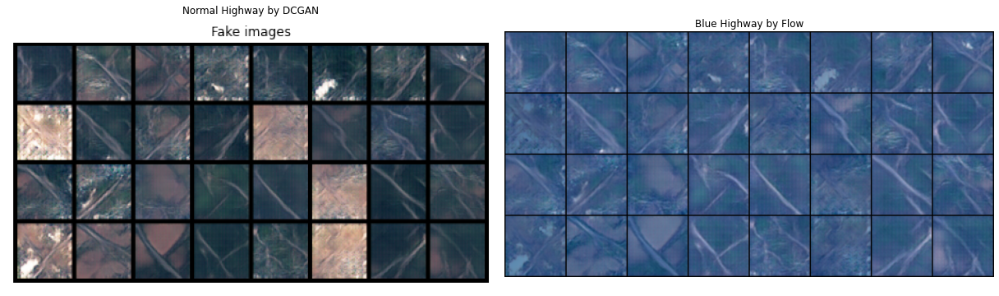

In [18]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/GAN_output/hw_normal.png")
ax1.imshow(img)
ax1.set_title("Normal Highway by DCGAN")
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/DCGAN_Flow/hw_dcgan_flow.png")
ax2.imshow(img)
ax2.set_title("Blue Highway by Flow")
ax2.axis("off")

fig.tight_layout()
fig.show()

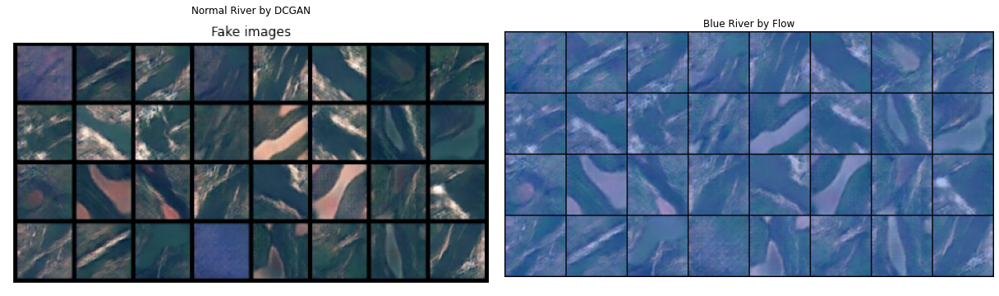

In [19]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/GAN_output/rv_normal.png")
ax1.imshow(img)
ax1.set_title("Normal River by DCGAN")
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/DCGAN_Flow/rv_dcgan_flow.png")
ax2.imshow(img)
ax2.set_title("Blue River by Flow")
ax2.axis("off")

fig.tight_layout()
fig.show()

# <span style="font-family:Roboto; color:#002E63"> Results of the experiments </span>

## <span style="font-family:Roboto; color:#FF3800"> Setting up experiments </span>

<span style="font-family:Roboto"> The next step is to set up trials to evaluate the Data Augmentation approach. We set up our experiments as shown figure below. Basically, we will use the Data Augmentation methods introduced above to generate new blue images, then add them to the original dataset retrain the classification model, and compare the error rates on the test set with the Baseline. There are a few caveats in our experiments: </span>
    <ul> <li> <span style="font-family:Roboto; color:gold"> First: </span> <span style="font-family:Roboto"> When we add blue images to the original dataset, the number of blue highway and blue river images corresponds to a pair of numbers on a matrix as shown in the resulting image in the next section. For example, with the number of added blue highway images `0`, the number of added blue river images will be `0,100,200,300...` so we will have the corresponding pairs of numbers `[0,0], [0,100], [0,200],...` The purpose of doing this is to see how many blue highway and blue river images need to be added to the original dataset to get the best results. </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> Second: </span> <span style="font-family:Roboto"> Each pair of blue highway and blue river image numbers will be added to the original dataset and retrained the model, it should be noted that as with baseline we also train 10 times with 10 different seeds. </span> </li> </ul>

<img src="/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/Exp/imgs/Exp.png" width= 750 alt="Picture" style="display: block; margin: 0 auto" />

## <span style="font-family:Roboto; color:#FF3800"> Evaluation </span>

<span style="font-family:Roboto"> After doing 10 training times with different seed values, we will calculate their average. Let's see the results when we add the new minority images to the original dataset. Below is an example of the FDA method and the Baseline is the ResNet18 model. </span>

- <span style="font-family:Roboto"> For specific steps to do this with the `Vgg16` model please see the source file and see all the results of the Data Augmentation methods please see notebook:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> </span>

- <span style="font-family:Roboto"> For specific steps to do this with the `ResNet18` model please see the source file and see all the results of the Data Augmentation methods please see notebook:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> </span>

In [3]:
nbs_highway = [0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200]
nbs_river = [0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200]

In [4]:
path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/NST_output/FDA/ResNet18"
accuracy, error_rate = average_seeds(path=path, nb_seeds=10)

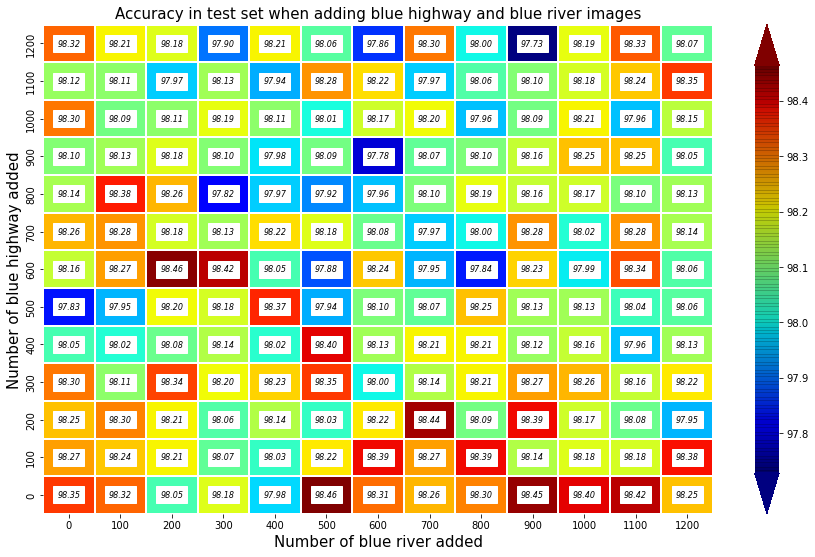

In [5]:
plot_heatmap_accuracy(accuracy, nbs_highway, nbs_river)

<span style="font-family:Roboto"> The figure above is the result of the `Accuracy` assessment after adding new blue images. We see that the pair of blue images highway and river giving the best Acc of `98.46%` are `[600,200]` and `[0,500]`. This highest ACC does not improve much compared to the Baseline `98.35%` (corresponding to the pair of numbers `[0,0]`). We can see on the heat chart figure there is a clear difference but basically, the value is not much different, we can see that the right heat column shows the lowest value of `97.8` and the highest value is `98.4`, there is no excessive difference between the min and max values. </span>

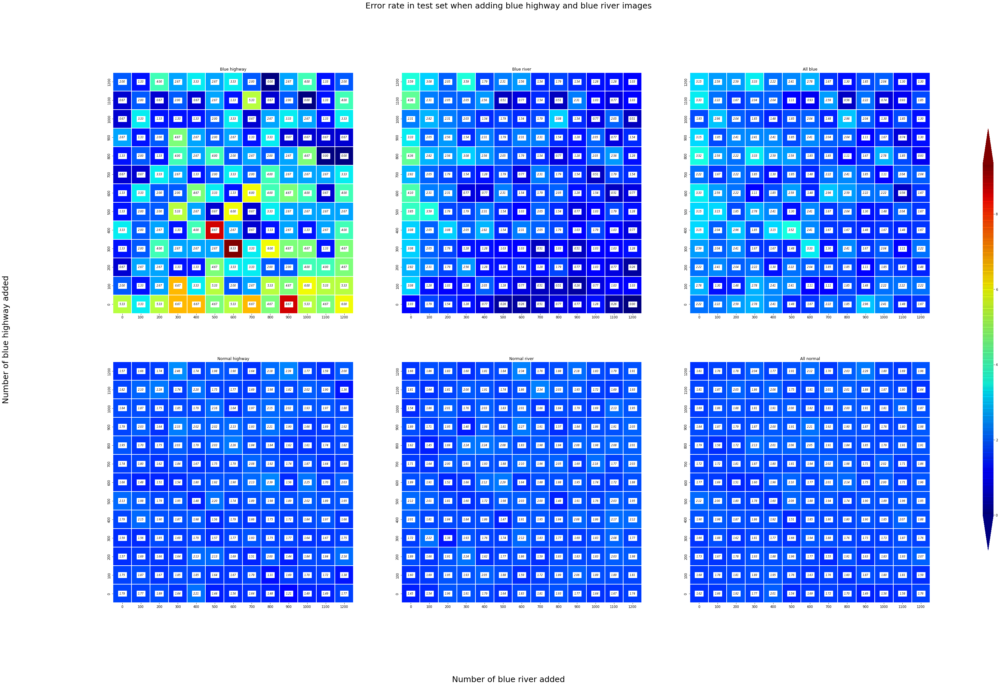

In [6]:
plot_heatmap_err_rate(error_rate, nbs_highway, nbs_river)

<span style="font-family:Roboto"> Next, we will plot heat maps of error rates across different groups. We will choose the most optimal pair of blue images highway and river of each Data Augmentation method. That is, it makes the error ratio between blue images and normal images the most balanced. </span>

## <span style="font-family:Roboto; color:#FF3800"> Results </span>

- <span style="font-family:Roboto"> To see all analysis of the results please see the following notebook:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> </span>

In [5]:
df_resnet18 = pd.read_csv('/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/Exp/new_resnet18_dataframe.csv')

In [6]:
df_vgg16 = pd.read_csv('/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/Exp/new_vgg16_dataframe.csv')

In [7]:
frames = [df_resnet18, df_vgg16]
result = pd.concat(frames)

In [8]:
array = ["Baseline", "Aug"]
dataframe = result[result['Method'].isin(array)]

### <span style="font-family:Roboto; color:#0BDA51"> Error rate of blue and normal images </span>

In [9]:
bl = dataframe[dataframe['Metric name']=="Err_bl"]
nor = dataframe[dataframe['Metric name']=="Err_nor"]

In [13]:
fig = px.box(bl, y='Metric value', color='Augmentation method', x='Method', facet_col='Model name', height=500, width=1400,
title='Comparison the error rate of blue images with different data augmentation methods',
color_discrete_sequence=["red", "green", "blue", "purple", "cyan", "darkorange", "darkseagreen", "deeppink", "firebrick", "yellowgreen", "indianred", "teal", "olive"])
fig.show()

<span style="font-family:Roboto"> We can see that the `STyleFlow` data augmentation method has worked well in reducing the error rate of blue images both `ResNet18` and `Vgg16` models.
    <ul> <li> <span style="font-family:Roboto; color:gold"> First: </span> <span style="font-family:Roboto"> For the ResNet18 model, the Data Augmentation methods that achieve the best results are Flow and Oversampling/15. As for the Vgg16 model, the best DA method is Flow. </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> Second: </span> <span style="font-family:Roboto"> Another point to note is that after combining `DCGAN` and `FDA`, the results seem to be better than when we only use `FDA`. </span> </li> </ul>

<span style="font-family:Roboto"> We can easily see that on the box plot corresponding to 10 different seeds, the error rate value is not stable, the variation is quite large. For ResNet18 there are 2 methods Flow and Oversampling/15 are relatively stable. </span>

In [48]:
fig = px.box(nor, y='Metric value', color='Augmentation method', x='Method', facet_col="Model name", height=500, width=1400,
title='Comparison the error rate of normal images with different data augmentation methods',
color_discrete_sequence=["red", "green", "blue", "purple", "cyan", "darkorange", "darkseagreen", "deeppink", "firebrick", "yellowgreen", "indianred", "teal", "olive"])
fig.show()

<span style="font-family:Roboto"> There is a contradiction here that for the `ResNet18` model after data augmentation the error rate of normal images usually seems to be increased, and for the `Vgg16` model the error rate of normal images is usually reduced along with the blue images. Like the blue images, the normal images also have instability errors corresponding to 10 seed values. </span>

### <span style="font-family:Roboto; color:#0BDA51"> Mean + Std </span>

In [15]:
def get_mean_std(dataframe):
    data = {}
    data["Augmentation method"] = dataframe["Augmentation method"].unique()

    for model in (dataframe["Model name"].unique()):
        for met in (dataframe["Method"].unique()):
            list_std = []
            list_mean = []
            for aug in (dataframe["Augmentation method"].unique()):
                std = dataframe.loc[(dataframe["Model name"] == model) & (dataframe["Augmentation method"] == aug) & (dataframe["Method"] == met), ["Metric value"]].std(ddof=0).item()
                m = dataframe.loc[(dataframe["Model name"] == model) & (dataframe["Augmentation method"] == aug) & (dataframe["Method"] == met), ["Metric value"]].mean().item()
                list_std.append(std)
                list_mean.append(m)

            data[model, met] = list_mean
            data[model, f"{met}_std"] = list_std

    df = pd.DataFrame(data).set_index("Augmentation method")
    df.columns = pd.MultiIndex.from_tuples(df.columns)
    return df

#### <span style="font-family:Roboto; color:#9370DB"> Blue images </span>

In [16]:
df_bl = get_mean_std(bl)

In [17]:
df_bl

ResNet18                                      Vgg16  \
                     Baseline Baseline_std       Aug   Aug_std  Baseline   
Augmentation method                                                        
FDA                  2.777778     1.707323  1.481481  1.385799  2.037037   
Flow                 2.777778     1.707323  2.037037  0.997253  2.037037   
CCPL                 2.777778     1.707323  3.888889  2.103299  2.037037   
DCGAN_FDA            2.777778     1.707323  1.481481  1.111111  2.037037   
DCGAN_Flow           2.777778     1.707323  1.666667  1.933390  2.037037   
Oversampling/5       2.777778     1.707323  2.592593  1.228380  2.037037   
Oversampling/10      2.777778     1.707323  1.296296  1.185764  2.037037   
Oversampling/15      2.777778     1.707323  1.851852  1.171214  2.037037   
Oversampling/20      2.777778     1.707323  1.666667  1.538264  2.037037   
Undersampling/5      2.777778     1.707323  4.074074  1.614407  2.037037   
Undersampling/10     2.777778     1.707323  4.814815  2.222222  2.037037   
Undersampling/15     2.777778     1.707323  8.518519  3.120796  2.037037   
Undersampling/20     2.777778     1.707323  7.592593  2.103299  2.037037   

                                                      
                    Baseline_std       Aug   Aug_std  
Augmentation method                                   
FDA                     2.103299  1.666667  1.747034  
Flow                    2.103299  0.925926  0.925926  
CCPL                    2.103299  2.777778  3.014596  
DCGAN_FDA               2.103299  1.481481  1.385799  
DCGAN_Flow              2.103299  2.592593  2.371527  
Oversampling/5          2.103299  2.037037  1.538264  
Oversampling/10         2.103299  2.407407  1.185764  
Oversampling/15         2.103299  1.666667  1.933390  
Oversampling/20         2.103299  1.481481  1.614407  
Undersampling/5         2.103299  5.740741  2.407407  
Undersampling/10        2.103299  6.111111  3.317865  
Undersampling/15        2.103299  9.629630  2.721655  
Undersampling/20        2.103299  9.814815  2.349737

In [18]:
fig = make_subplots(rows=1, cols=2, subplot_titles=("ResNet18", "Vgg16"))
x = ['FDA', 'Flow', 'CCPL', 'DCGAN_FDA', 'DCGAN_Flow', 'Oversampling/5', 'Oversampling/10', 'Oversampling/15', 'Oversampling/20', 'Undersampling/5', 'Undersampling/10', 'Undersampling/15', 'Undersampling/20']

fig.add_trace(go.Bar(
    name='Baseline ResNet18',
    x=x, y=df_bl.ResNet18.Baseline,
    error_y=dict(type='data', array=df_bl.ResNet18.Baseline_std)
), row=1, col=1)

fig.add_trace(go.Bar(
    name='Augmentation ResNet18',
    x=x, y=df_bl.ResNet18.Aug,
    error_y=dict(type='data', array=df_bl.ResNet18.Aug_std)
), row=1, col=1)

fig.add_trace(go.Bar(
    name='Baseline Vgg16',
    x=x, y=df_bl.Vgg16.Baseline,
    error_y=dict(type='data', array=df_bl.Vgg16.Baseline_std)
), row=1, col=2)

fig.add_trace(go.Bar(
    name='Augmentation Vgg16',
    x=x, y=df_bl.Vgg16.Aug,
    error_y=dict(type='data', array=df_bl.Vgg16.Aug_std)
), row=1, col=2)

fig.update_xaxes(title_text="Data Augmentation Methods", row=1, col=1)
fig.update_xaxes(title_text="Data Augmentation Methods", row=1, col=2)
fig.update_layout(title="Average error rate of blue images according to different data augmentation methods", yaxis_title="Error rate", barmode="group")
fig.show()

- <span style="font-family:Roboto"> `ResNet18:` We see that both the `FDA` and `DCGAN_FDA` methods achieve an error rate of as little as 1.48 but the `DCGAN_FDA` method obtains a smaller std than the `FDA` method. `DCGAN_Flow` method achieves better results than `Flow` but std is higher. The method to achieve the least error is Oversampling/10. </span>

- <span style="font-family:Roboto"> `Vgg 16:` The `Flow` method with the best results followed by the `DCGAN_FDA` method and then the `FDA`. </span>

#### <span style="font-family:Roboto; color:#9370DB"> Normal images </span>

In [19]:
df_nor = get_mean_std(nor)

In [20]:
df_nor

ResNet18                                      Vgg16  \
                     Baseline Baseline_std       Aug   Aug_std  Baseline   
Augmentation method                                                        
FDA                  1.195652     0.204977  1.780936  0.330347  3.854515   
Flow                 1.195652     0.204977  1.647157  0.317396  3.854515   
CCPL                 1.195652     0.204977  2.224080  0.267559  3.854515   
DCGAN_FDA            1.195652     0.204977  1.530100  0.274904  3.854515   
DCGAN_Flow           1.195652     0.204977  1.680602  0.228828  3.854515   
Oversampling/5       1.195652     0.204977  1.672241  0.250836  3.854515   
Oversampling/10      1.195652     0.204977  1.931438  0.433575  3.854515   
Oversampling/15      1.195652     0.204977  1.638796  0.198568  3.854515   
Oversampling/20      1.195652     0.204977  1.479933  0.272349  3.854515   
Undersampling/5      1.195652     0.204977  3.779264  0.894922  3.854515   
Undersampling/10     1.195652     0.204977  5.200669  1.255184  3.854515   
Undersampling/15     1.195652     0.204977  7.675585  1.538916  3.854515   
Undersampling/20     1.195652     0.204977  8.578595  2.125194  3.854515   

                                                       
                    Baseline_std        Aug   Aug_std  
Augmentation method                                    
FDA                     0.463199   3.586957  0.464705  
Flow                    0.463199   3.469900  0.465907  
CCPL                    0.463199   4.105351  0.343624  
DCGAN_FDA               0.463199   3.369565  0.394043  
DCGAN_Flow              0.463199   3.687291  0.455590  
Oversampling/5          0.463199   3.620401  0.474531  
Oversampling/10         0.463199   3.628763  0.514333  
Oversampling/15         0.463199   3.603679  0.532038  
Oversampling/20         0.463199   3.461538  0.345147  
Undersampling/5         0.463199   6.279264  0.830626  
Undersampling/10        0.463199   8.177258  0.725837  
Undersampling/15        0.463199   8.954849  1.109523  
Undersampling/20        0.463199  10.234114  1.177239

In [21]:
fig = make_subplots(rows=1, cols=2, subplot_titles=("ResNet18", "Vgg16"))
x = ['FDA', 'Flow', 'CCPL', 'DCGAN_FDA', 'DCGAN_Flow', 'Oversampling/5', 'Oversampling/10', 'Oversampling/15', 'Oversampling/20', 'Undersampling/5', 'Undersampling/10', 'Undersampling/15', 'Undersampling/20']

fig.add_trace(go.Bar(
    name='Baseline ResNet18',
    x=x, y=df_nor.ResNet18.Baseline,
    error_y=dict(type='data', array=df_nor.ResNet18.Baseline_std)
), row=1, col=1)

fig.add_trace(go.Bar(
    name='Augmentation ResNet18',
    x=x, y=df_nor.ResNet18.Aug,
    error_y=dict(type='data', array=df_nor.ResNet18.Aug_std)
), row=1, col=1)

fig.add_trace(go.Bar(
    name='Baseline Vgg16',
    x=x, y=df_nor.Vgg16.Baseline,
    error_y=dict(type='data', array=df_nor.Vgg16.Baseline_std)
), row=1, col=2)

fig.add_trace(go.Bar(
    name='Augmentation Vgg16',
    x=x, y=df_nor.Vgg16.Aug,
    error_y=dict(type='data', array=df_nor.Vgg16.Aug_std)
), row=1, col=2)

fig.update_xaxes(title_text="Data Augmentation Methods", row=1, col=1)
fig.update_xaxes(title_text="Data Augmentation Methods", row=1, col=2)
fig.update_layout(title="Average error rate of normal images according to different data augmentation methods", yaxis_title="Error rate", barmode="group")
fig.show()

- <span style="font-family:Roboto"> We again see that the error rate of normal images with the `Vgg16` model is essentially reduced but increases for the `ResNet18` model. </span>

#### <span style="font-family:Roboto; color:#9370DB"> Summary </span>

- <span style="font-family:Roboto"> In general, the DA methods improve the error rate of the minority group of images that are blue images. However we can see that the CCPL method does not work in this case. </span>

- <span style="font-family:Roboto"> After using DA methods the error rate of normal images with ResNet18 increased a bit. For the Vgg16 model, the error rate of the normal image is also improved. </span>

- <span style="font-family:Roboto"> The combination of DCGAN + FDA or DCGAN + Flow works better than FDA or Flow on ResNet18 models but not on Vgg16. </span>

# <span style="font-family:Roboto; color:#002E63"> Explainable AI </span>

<span style="font-family:Roboto"> Some of the questions raised are: </span>
    <ul> <li> <span style="font-family:Roboto; color:gold"> Ques 1: </span> <span style="font-family:Roboto"> What is the difference in predicting an image between a baseline model and a model after data enhancement?
    </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> Ques 2: </span> <span style="font-family:Roboto"> What is the difference between the true and false prediction of the model? </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> Ques 3: </span> <span style="font-family:Roboto"> How to evaluate them? </span> </li> </ul>

<span style="font-family:Roboto"> So, to answer these questions we attack XAI methods. Here we use the methods shown below, they are available in the [OmniXAI](https://github.com/salesforce/OmniXAI) library. </span>

<img src="/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/Exp/imgs/xai.png" width=750 alt="Picture" style="display: block; margin: 0 auto" />

## <span style="font-family:Roboto; color:#FF3800"> Attributions </span>

<span style="font-family:Roboto"> We will first use XAI methods to generate attributes to see where the classification models are based on the input image to predict if it is a highway or a river image. Specifically where the saliency maps will be concentrated in the image, let's see a few examples below. </span>

- <span style="font-family:Roboto"> For specific steps to make this work for `ResNet18` model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> </span>

- <span style="font-family:Roboto"> For specific steps to make this work for `Vgg16` model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> </span>

### <span style="font-family:Roboto; color:#0BDA51"> ResNet18 </span>

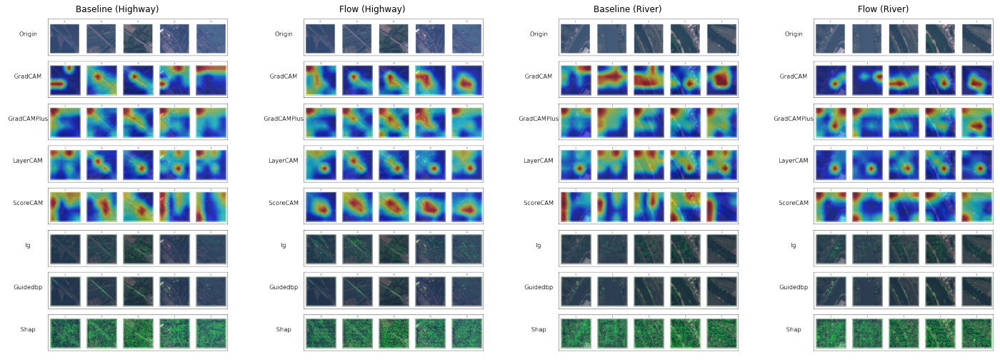

In [28]:
fig = plt.figure(figsize=(20,7))

ax1 = fig.add_subplot(1, 4, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/XAI_Output/ResNet18/hw_ori.png")
ax1.imshow(img)
ax1.axis("off")
ax1.set_title("Baseline (Highway)")

ax2 = fig.add_subplot(1, 4, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/XAI_Output/ResNet18/hw_flow.png")
ax2.imshow(img)
ax2.axis("off")
ax2.set_title("Flow (Highway)")

ax3 = fig.add_subplot(1, 4, 3)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/XAI_Output/ResNet18/rv_ori.png")
ax3.imshow(img)
ax3.axis("off")
ax3.set_title("Baseline (River)")

ax4 = fig.add_subplot(1, 4, 4)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/XAI_Output/ResNet18/rv_flow.png")
ax4.imshow(img)
ax4.axis("off")
ax4.set_title("Flow (River)")

fig.tight_layout()
fig.show()

### <span style="font-family:Roboto; color:#0BDA51"> Vgg16 </span>

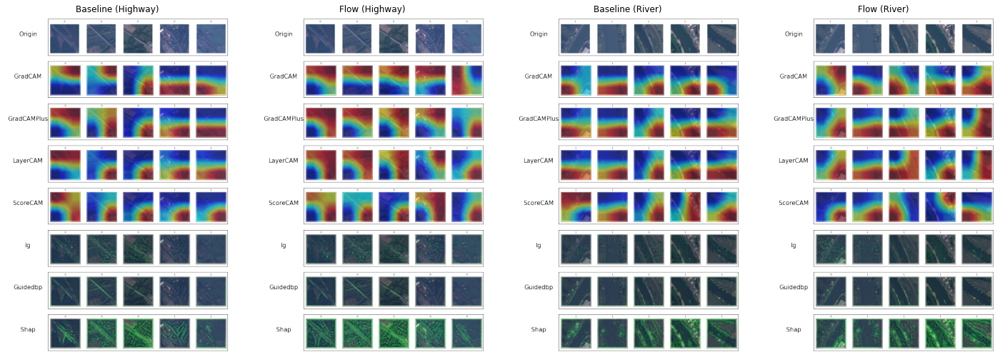

In [29]:
fig = plt.figure(figsize=(20,7))

ax1 = fig.add_subplot(1, 4, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/XAI_Output/Vgg16/hw_ori.png")
ax1.imshow(img)
ax1.axis("off")
ax1.set_title("Baseline (Highway)")

ax2 = fig.add_subplot(1, 4, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/XAI_Output/Vgg16/hw_flow.png")
ax2.imshow(img)
ax2.axis("off")
ax2.set_title("Flow (Highway)")

ax3 = fig.add_subplot(1, 4, 3)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/XAI_Output/Vgg16/rv_ori.png")
ax3.imshow(img)
ax3.axis("off")
ax3.set_title("Baseline (River)")

ax4 = fig.add_subplot(1, 4, 4)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/XAI_Output/Vgg16/rv_flow.png")
ax4.imshow(img)
ax4.axis("off")
ax4.set_title("Flow (River)")

fig.tight_layout()
fig.show()

## <span style="font-family:Roboto; color:#FF3800"> XAI metrics </span>

<span style="font-family:Roboto"> How to evaluate these XAI methods? We will use the two metrics mentioned below: </span>
    <ul> <li> <span style="font-family:Roboto; color:gold"> Deletion Metric: </span> <span style="font-family:Roboto"> The deletion metric measures the drop in the probability of a class as important pixels (given by the saliency map) are gradually removed from the image. A sharp drop, and thus a small area under the probability curve, are indicative of a good explanation. (Lower is better) | 📰 [Paper](https://arxiv.org/pdf/1806.07421.pdf)
    </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> Insertion Metric: </span> <span style="font-family:Roboto"> The insertion metric, on the other hand, captures the importance of the pixels in terms of their ability to synthesize an image and is measured by the rise in the probability of the class of interest as pixels are added according to the generated importance map. (Higher is better) | 📰 [Paper](https://arxiv.org/pdf/1806.07421.pdf) </span> </li> </ul>

- <span style="font-family:Roboto"> For specific steps to make this work for `ResNet18` model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> </span>

- <span style="font-family:Roboto"> For specific steps to make this work for `Vgg16` model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> </span>

In [14]:
df = pd.read_csv('/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/xai_dataframe.csv')

In [15]:
del_vgg = df[(df['Metric name']=="Deletion") & (df['Model name']=="Vgg16")]
ins_vgg = df[(df['Metric name']=="Insertion") & (df['Model name']=="Vgg16")]

In [16]:
del_vgg_hw = del_vgg[del_vgg['Image class']=="Highway"]
del_vgg_rv = del_vgg[del_vgg['Image class']=="River"]

In [17]:
ins_vgg_hw = ins_vgg[ins_vgg['Image class']=="Highway"]
ins_vgg_rv = ins_vgg[ins_vgg['Image class']=="River"]

### <span style="font-family:Roboto; color:#0BDA51"> Deletion and Insertion score </span>

#### <span style="font-family:Roboto; color:#9370DB"> Deletion score </span>

In [18]:
fig = px.box(del_vgg_hw, y='Metric value', x='XAI method', color='Model type', facet_col="Prediction", height=600, width=2200,
title='Comparison the Deletion score of Highway images (Vgg16)')
fig.show()

#### <span style="font-family:Roboto; color:#9370DB"> Insertion score </span>

In [19]:
fig = px.box(ins_vgg_hw, y='Metric value', x='XAI method', color='Model type', facet_col="Prediction", height=600, width=2200,
title='Comparison the Insertion score of Highway images (Vgg16)')
fig.show()

<span style="font-family:Roboto"> The XAI methods explained the difference between the true and false predictions of the model. In fact, in the case of wrong predictions, the XAI methods also do not work well. </span>

### <span style="font-family:Roboto; color:#0BDA51"> Mean + Std </span>

In [20]:
def get_mean_std(dataframe):
    data = {}
    data["XAI method"] = dataframe["XAI method"].unique()

    for model in (dataframe["Model name"].unique()):
        for met in (dataframe["Model type"].unique()):
            list_std = []
            list_mean = []
            for xai in (dataframe["XAI method"].unique()):
                std = dataframe.loc[(dataframe["Model name"] == model) & (dataframe["XAI method"] == xai) & (dataframe["Model type"] == met), ["Metric value"]].std(ddof=0).item()
                m = dataframe.loc[(dataframe["Model name"] == model) & (dataframe["XAI method"] == xai) & (dataframe["Model type"] == met), ["Metric value"]].mean().item()
                list_std.append(std)
                list_mean.append(m)

            data[model, met] = list_mean
            data[model, f"{met}_std"] = list_std

    df = pd.DataFrame(data).set_index("XAI method")
    df.columns = pd.MultiIndex.from_tuples(df.columns)
    return df

In [21]:
df_hw = df[df['Image class']=="Highway"]
df_rv = df[df['Image class']=="River"]

In [22]:
del_hw = df_hw[(df_hw['Metric name']=="Deletion") & (df_hw['Prediction']==True)]
ins_hw = df_hw[(df_hw['Metric name']=="Insertion") & (df_hw['Prediction']==True)]

del_rv = df_rv[(df_rv['Metric name']=="Deletion") & (df_rv['Prediction']==True)]
ins_rv = df_rv[(df_rv['Metric name']=="Insertion") & (df_rv['Prediction']==True)]

#### <span style="font-family:Roboto; color:#9370DB"> Deletion score </span>

In [23]:
df_del_hw = get_mean_std(del_hw)
df_del_rv = get_mean_std(del_rv)

In [24]:
df_vgg = df_del_hw.Vgg16

In [25]:
fig = go.Figure()
x = ['GradCAM', 'GradCAMPlus', 'LayerCAM', 'ScoreCAM', 'Ig', 'Guidedbp', 'Shap']

fig.add_trace(go.Bar(
    name='Baseline',
    x=x, y=df_vgg.Baseline,
    error_y=dict(type='data', array=df_vgg.Baseline_std)
))
fig.add_trace(go.Bar(
    name='FDA',
    x=x, y=df_vgg.FDA,
    error_y=dict(type='data', array=df_vgg.FDA_std)
))
fig.add_trace(go.Bar(
    name='Flow',
    x=x, y=df_vgg.Flow,
    error_y=dict(type='data', array=df_vgg.Flow_std)
))
fig.add_trace(go.Bar(
    name='CCPl',
    x=x, y=df_vgg.CCPL,
    error_y=dict(type='data', array=df_vgg.CCPL_std)
))
fig.add_trace(go.Bar(
    name='DCGAN_FDA',
    x=x, y=df_vgg.DCGAN_FDA,
    error_y=dict(type='data', array=df_vgg.DCGAN_FDA_std)
))
fig.add_trace(go.Bar(
    name='DCGAN_Flow',
    x=x, y=df_vgg.DCGAN_Flow,
    error_y=dict(type='data', array=df_vgg.DCGAN_Flow_std)
))

fig.update_layout(title="Deletion metric of Highway images of Vgg16", xaxis_title="XAI method", yaxis_title="Deletion", barmode="group")
fig.show()

In [26]:
df_vgg = df_del_rv.Vgg16

In [27]:
fig = go.Figure()
x = ['GradCAM', 'GradCAMPlus', 'LayerCAM', 'ScoreCAM', 'Ig', 'Guidedbp', 'Shap']

fig.add_trace(go.Bar(
    name='Baseline',
    x=x, y=df_vgg.Baseline,
    error_y=dict(type='data', array=df_vgg.Baseline_std)
))
fig.add_trace(go.Bar(
    name='FDA',
    x=x, y=df_vgg.FDA,
    error_y=dict(type='data', array=df_vgg.FDA_std)
))
fig.add_trace(go.Bar(
    name='Flow',
    x=x, y=df_vgg.Flow,
    error_y=dict(type='data', array=df_vgg.Flow_std)
))
fig.add_trace(go.Bar(
    name='CCPl',
    x=x, y=df_vgg.CCPL,
    error_y=dict(type='data', array=df_vgg.CCPL_std)
))
fig.add_trace(go.Bar(
    name='DCGAN_FDA',
    x=x, y=df_vgg.DCGAN_FDA,
    error_y=dict(type='data', array=df_vgg.DCGAN_FDA_std)
))
fig.add_trace(go.Bar(
    name='DCGAN_Flow',
    x=x, y=df_vgg.DCGAN_Flow,
    error_y=dict(type='data', array=df_vgg.DCGAN_Flow_std)
))

fig.update_layout(title="Deletion metric of River images of Vgg16", xaxis_title="XAI method", yaxis_title="Deletion", barmode="group")
fig.show()

#### <span style="font-family:Roboto; color:#9370DB"> Insertion score </span>

In [28]:
df_ins_hw = get_mean_std(ins_hw)
df_ins_rv = get_mean_std(ins_rv)

In [29]:
df_vgg = df_ins_hw.Vgg16

In [30]:
fig = go.Figure()
x = ['GradCAM', 'GradCAMPlus', 'LayerCAM', 'ScoreCAM', 'Ig', 'Guidedbp', 'Shap']

fig.add_trace(go.Bar(
    name='Baseline',
    x=x, y=df_vgg.Baseline,
    error_y=dict(type='data', array=df_vgg.Baseline_std)
))
fig.add_trace(go.Bar(
    name='FDA',
    x=x, y=df_vgg.FDA,
    error_y=dict(type='data', array=df_vgg.FDA_std)
))
fig.add_trace(go.Bar(
    name='Flow',
    x=x, y=df_vgg.Flow,
    error_y=dict(type='data', array=df_vgg.Flow_std)
))
fig.add_trace(go.Bar(
    name='CCPl',
    x=x, y=df_vgg.CCPL,
    error_y=dict(type='data', array=df_vgg.CCPL_std)
))
fig.add_trace(go.Bar(
    name='DCGAN_FDA',
    x=x, y=df_vgg.DCGAN_FDA,
    error_y=dict(type='data', array=df_vgg.DCGAN_FDA_std)
))
fig.add_trace(go.Bar(
    name='DCGAN_Flow',
    x=x, y=df_vgg.DCGAN_Flow,
    error_y=dict(type='data', array=df_vgg.DCGAN_Flow_std)
))

fig.update_layout(title="Insertion metric of Highway images of Vgg16", xaxis_title="XAI method", yaxis_title="Insertion", barmode="group")
fig.show()

In [31]:
df_vgg = df_ins_rv.Vgg16

In [32]:
fig = go.Figure()
x = ['GradCAM', 'GradCAMPlus', 'LayerCAM', 'ScoreCAM', 'Ig', 'Guidedbp', 'Shap']

fig.add_trace(go.Bar(
    name='Baseline',
    x=x, y=df_vgg.Baseline,
    error_y=dict(type='data', array=df_vgg.Baseline_std)
))
fig.add_trace(go.Bar(
    name='FDA',
    x=x, y=df_vgg.FDA,
    error_y=dict(type='data', array=df_vgg.FDA_std)
))
fig.add_trace(go.Bar(
    name='Flow',
    x=x, y=df_vgg.Flow,
    error_y=dict(type='data', array=df_vgg.Flow_std)
))
fig.add_trace(go.Bar(
    name='CCPl',
    x=x, y=df_vgg.CCPL,
    error_y=dict(type='data', array=df_vgg.CCPL_std)
))
fig.add_trace(go.Bar(
    name='DCGAN_FDA',
    x=x, y=df_vgg.DCGAN_FDA,
    error_y=dict(type='data', array=df_vgg.DCGAN_FDA_std)
))
fig.add_trace(go.Bar(
    name='DCGAN_Flow',
    x=x, y=df_vgg.DCGAN_Flow,
    error_y=dict(type='data', array=df_vgg.DCGAN_Flow_std)
))

fig.update_layout(title="Insertion metric of River images of Vgg16", xaxis_title="XAI method", yaxis_title="Insertion", barmode="group")
fig.show()

<span style="font-family:Roboto"> Based on the criteria of metrics, for Deletion lower is better and Insertion higher is better. We find that CAM methods explain Highway images well, while methods like Ig, Guidedbp, and Shap explain better with River images. </span>

## <span style="font-family:Roboto; color:#FF3800"> Example of Deletion and Insertion games (Baseline) </span>

<span style="font-family:Roboto"> To illustrate our comment above let's take a look at some examples below of the Deletion and Insertion games of XAI methods. In fact, the Deletion and Insertion scores are calculated using the `Iou` formula, i.e. the area of the area below the blue line in the figures below. </span>

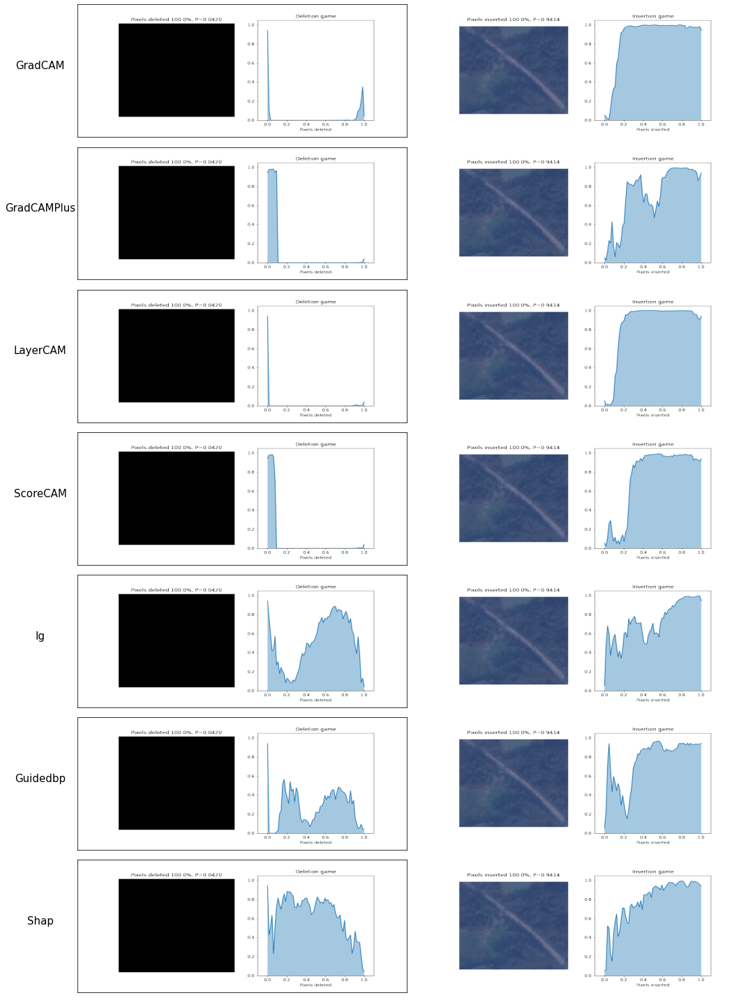

In [80]:
path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/XAI_Output/ResNet18/bas"

fig = plt.figure(figsize=(15,20))
rows = ['GradCAM', 'GradCAMPlus', 'LayerCAM', 'ScoreCAM', 'Ig', 'Guidedbp', 'Shap']
methods = ['grad_cam', 'grad_cam_plus', 'layer_cam', 'score_cam', 'ig', 'guidedbp', 'shap']

gs = fig.add_gridspec(7,2)
for num in range(1,8):
    ax = fig.add_subplot(gs[num-1,0])
    img = PilImage.open(f"{path}/del_bon_hw_{methods[num-1]}.png")
    ax.imshow(img, aspect='auto')
    ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
    ax.yaxis.label.set_color('black')
    ax.set_xticks([])
    ax.set_yticks([])

    ax = fig.add_subplot(gs[num-1,1])
    img = PilImage.open(f"{path}/ins_bon_hw_{methods[num-1]}.png")
    ax.imshow(img, aspect='auto')
    ax.axis("off")

fig.tight_layout()
plt.show()

<span style="font-family:Roboto"> Here we take an example of a highway image and see how the Deletion and Insertion scores play out. We clearly see that CAM methods have better results than others. Specifically for Deletion, the area below the blue line is quite small, and above all, the blue line decreases to zero very quickly. As for Insertion, the blue graph increases rapidly and gets close to 1, making the area below set a high score. </span>

<span style="font-family:Roboto"> However, there is a point to note here that in the case of Deletion of CAM methods, there is a peak at the end of the stroke. This is because the classification model we use is not good enough. </span>

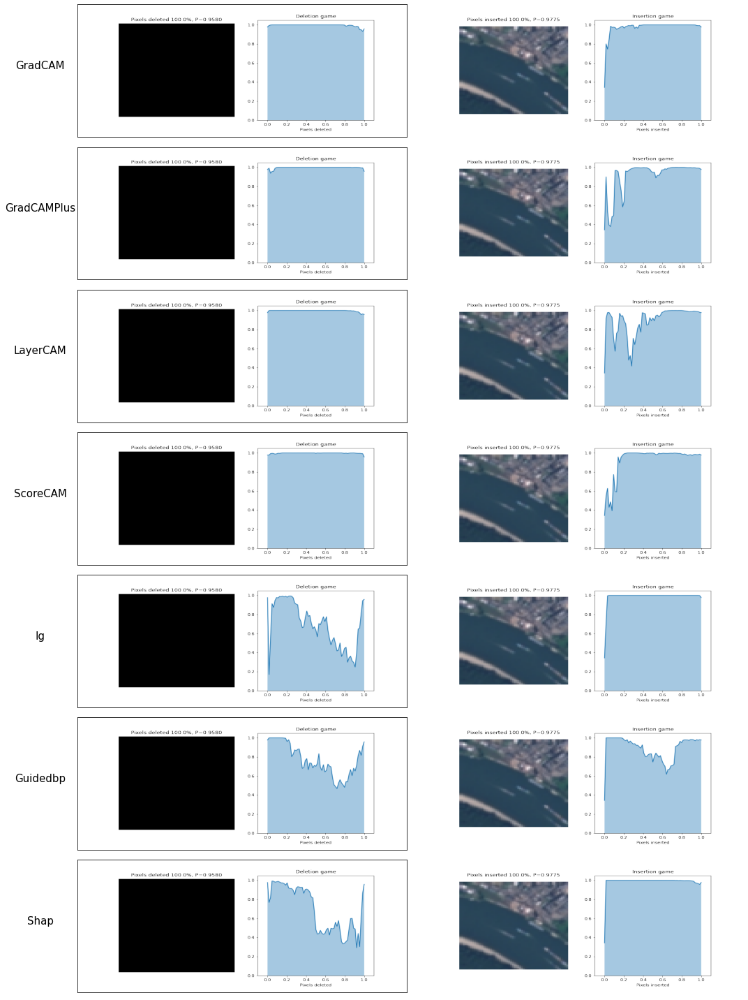

In [81]:
path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/XAI_Output/ResNet18/bas"

fig = plt.figure(figsize=(15,20))
rows = ['GradCAM', 'GradCAMPlus', 'LayerCAM', 'ScoreCAM', 'Ig', 'Guidedbp', 'Shap']
methods = ['grad_cam', 'grad_cam_plus', 'layer_cam', 'score_cam', 'ig', 'guidedbp', 'shap']

gs = fig.add_gridspec(7,2)
for num in range(1,8):
    ax = fig.add_subplot(gs[num-1,0])
    img = PilImage.open(f"{path}/del_bon_rv_{methods[num-1]}.png")
    ax.imshow(img, aspect='auto')
    ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
    ax.yaxis.label.set_color('black')
    ax.set_xticks([])
    ax.set_yticks([])

    ax = fig.add_subplot(gs[num-1,1])
    img = PilImage.open(f"{path}/ins_bon_rv_{methods[num-1]}.png")
    ax.imshow(img, aspect='auto')
    ax.axis("off")

fig.tight_layout()
plt.show()

<span style="font-family:Roboto"> Now let's look at an example of a river image to see if the result matches our comments in the previous section. We can clearly see that although Ig, Shap, and Guidedbp methods don't work very well, it is better than CAM methods both in terms of Deletion and Insertion game. </span>

## <span style="font-family:Roboto; color:#FF3800"> Difference between Baseline and Augmented model </span>

<span style="font-family:Roboto"> In the previous section, we saw that there is a peak at the end of the Deletion line, this is because the model we used is not good. So let's see if augmented models improve this. </span>

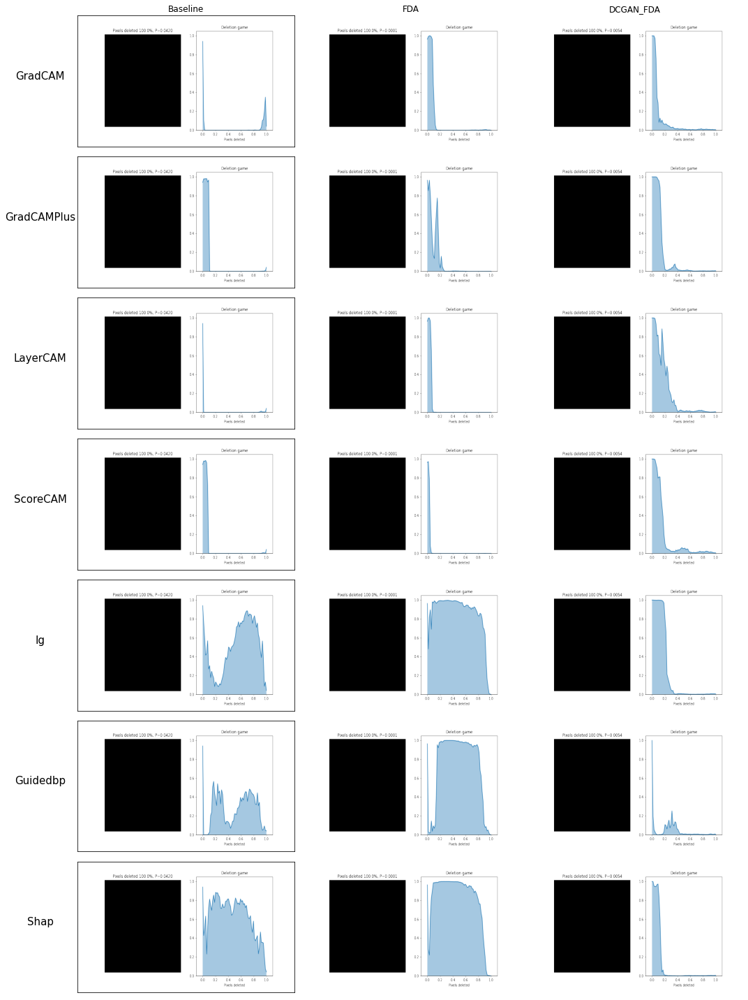

In [86]:
path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/XAI_Output/ResNet18"

fig = plt.figure(figsize=(15,20))
rows = ['GradCAM', 'GradCAMPlus', 'LayerCAM', 'ScoreCAM', 'Ig', 'Guidedbp', 'Shap']
methods = ['grad_cam', 'grad_cam_plus', 'layer_cam', 'score_cam', 'ig', 'guidedbp', 'shap']

gs = fig.add_gridspec(7,3)
for num in range(1,8):
    ax = fig.add_subplot(gs[num-1,0])
    img = PilImage.open(f"{path}/bas/del_bon_hw_{methods[num-1]}.png")
    ax.imshow(img, aspect='auto')
    ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
    ax.yaxis.label.set_color('black')
    ax.set_xticks([])
    ax.set_yticks([])
    if num == 1:
        ax.set_title("Baseline")

    ax = fig.add_subplot(gs[num-1,1])
    img = PilImage.open(f"{path}/fda/del_bon_hw_{methods[num-1]}.png")
    ax.imshow(img, aspect='auto')
    ax.axis("off")
    if num == 1:
        ax.set_title("FDA")

    ax = fig.add_subplot(gs[num-1,2])
    img = PilImage.open(f"{path}/dcgan_fda/del_bon_hw_{methods[num-1]}.png")
    ax.imshow(img, aspect='auto')
    ax.axis("off")
    if num == 1:
        ax.set_title("DCGAN_FDA")

fig.tight_layout()
plt.show()

<span style="font-family:Roboto"> Here we will compare the baseline model with the FDA and DCGAN_FDA. We see that the Deletion curve of the model trained with FDA-generated data no longer has peaks at the end. This proves that the model enhanced by the FDA method is better than the Baseline. </span>

<span style="font-family:Roboto"> The model trained with data generated by DCGAN_FDA also performed well. We can see its Deletion line is sometimes even smoother than the FDA specifically in the GradCAMPlus interpretation method. Another point worth noting is that for Ig, Guidedbp, and Shap interpretation methods the FDA's Deletion line is not much better. However, it is clear that the Deletion line of DCGAN_FDA has improved significantly and is much smoother. This proves that the combination of DCGAN and FDA is better than using FDA alone. </span>

### <span style="font-family:Roboto; color:#0BDA51"> Summary </span>

- <span style="font-family:Roboto"> The XAI methods explained the difference between the true and false predictions of the model. </span>

- <span style="font-family:Roboto"> They also explain why models with data augmentation have better performance than baseline models. Especially, the combination of GAN and NST achieves the best results. </span>

- <span style="font-family:Roboto"> We also find that CAM methods explain Highway images well, while methods like Ig, Guidedbp, Shap explain better with River images. </span>

- <span style="font-family:Roboto"> However, there are still a few failure cases, that is, the Deletion scores of some cases are still quite high, especially for River images. This is because during the selection of important features, the XAI methods cannot get rid of the background noise, causing the mask of important pixels to take up almost the entire image to be explained. </span>

# <span style="font-family:Roboto; color:#002E63"> Conclusions </span>

<span style="font-family:Roboto"> In this notebook we explored how to identify the minority groups present in the EuroSAT dataset and see how they bias AI models. Also note that it sometimes produces bias for one model but not for another. </span>

<span style="font-family:Roboto"> We have also implemented data augmentation methods for the minority groups that are blue-veiled images. Data Augmentation methods include Oversampling, Undersampling, FDA, StyleFlow, CCPL, and a combination of DCGAN_FDA and DCGAN_Flow. </span>

<span style="font-family:Roboto"> We also set up an experiment to see which DA method worked best for correcting minorities. We run an experiment to see how many images of the minority class should be added to the original data for the best results. To see if minority error rates were stable we also trained models with 10 different seed values. We have a few points to note as follows: </span>

- <span style="font-family:Roboto"> It is worth noting here that Baseline is quite strong, it reaches *Acc* about *97%*. We can aim to do something more complex than binary classification. </span>

- <span style="font-family:Roboto"> In general, the DA methods improve the error rate of the minority group of images that are blue images. However we can see that the CCPL method does not work in this case. </span>

- <span style="font-family:Roboto"> After using DA methods the error rate of normal images with ResNet18 increased a bit. For the Vgg16 model, the error rate of the normal image is also improved. </span>

- <span style="font-family:Roboto"> The combination of DCGAN_FDA or DCGAN_Flow works better than FDA or Flow on ResNet18 models but not on Vgg16. </span>

<span style="font-family:Roboto"> We also performed XAI methods to explain the differences between the baseline model and the data-augmented model.</span>

- <span style="font-family:Roboto"> We looked at the difference between the true and false predictions of the model. </span>

- <span style="font-family:Roboto"> See which XAI method works well with which image classes in the dataset. </span>

- <span style="font-family:Roboto"> See which DA method helps the model achieve the best results. </span>

<span style="font-family:Roboto; color:#FF3800"> Limitations: </span>

- <span style="font-family:Roboto"> This task has not been tested much on different models. This is done only with pre-trained models. </span>

- <span style="font-family:Roboto"> Not many combinations between GAN and NST models have been made. </span>

- <span style="font-family:Roboto"> Haven't tested on other datasets. </span>